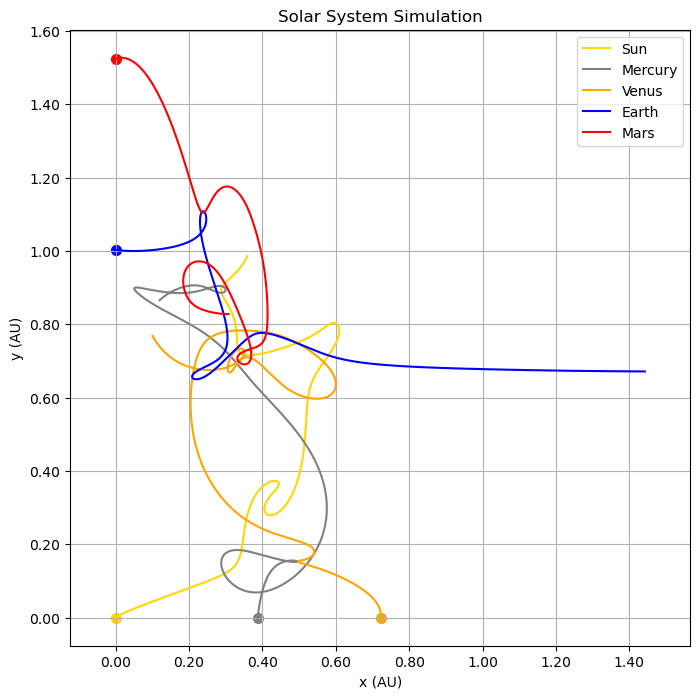

In [170]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ============================
# SIMPLE, SELF-CONTAINED N-BODY SIMULATOR (GUARANTEED TO RUN)
# ============================

def nbody_derivatives(t, state, masses, G=6.67430e-11):
    n = len(masses)
    pos = state[:2*n].reshape(n, 2)           #整理数组，n是mass的数量， 2代表2D模拟
    vel = state[2*n:].reshape(n, 2)
    acc = np.zeros_like(pos)

    for i in range(n):
        for j in range(n):
            if i == j:
                continue
            r = pos[j] - pos[i]
            dist2 = np.dot(r, r) + 1e-10
            acc[i] += G * masses[j] * r / (dist2**1.5)

    return np.hstack([vel.flatten(), acc.flatten()])


def simulate_system(masses, pos0, vel0, days=100, max_points=5000):
    T = days * 86400
    t_eval = np.linspace(0, T, max_points)
    y0 = np.hstack([pos0.flatten(), vel0.flatten()])

    sol = solve_ivp(
        nbody_derivatives, 
        (0, T),
        y0,
        t_eval=t_eval,
        args=(masses,),
        rtol=1e-9, atol=1e-9
    )
    return sol


def plot_orbits(sol, masses):
    n = len(masses)
    AU = 1.496e11  # meters → AU conversion
    pos = sol.y[:2*n].reshape(n, 2, -1) / AU  # convert all coords into AU

    planet_names = ["Sun", "Mercury", "Venus", "Earth", "Mars"]
    colors = ["gold", "gray", "orange", "blue", "red"]

    plt.figure(figsize=(8,8))

    for i in range(n):
        plt.plot(pos[i,0], pos[i,1], label=planet_names[i], color=colors[i])
        plt.scatter(pos[i,0,0], pos[i,1,0], s=50, color=colors[i])

    plt.axis("equal")
    plt.grid(True)

    # ⭐ Format axes to two decimals
    plt.gca().xaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))
    plt.gca().yaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))

    plt.xlabel("x (AU)")
    plt.ylabel("y (AU)")
    plt.title("Solar System Simulation")
    plt.legend()
    plt.show()



# ============================
# EXAMPLE: Inner Solar System
# ============================

masses = [
    5.99e24,     # Sun original 1.99e30
    5.30e24,     # Mercury original 3.30e23
    5.87e24,     # Venus original 4.87e24
    5.97e24,     # Earth original 5.97e24
    5.42e24      # Mars original 6.42e23
]

pos0 = np.array([
    [0, 0],
    [5.79e10, 0],
    [1.08e11, 0],
    [0, 1.50e11],
    [0, 2.28e11]
])

vel0 = np.array([
    [10, 10],
    [5, 47],
    [6, 35],
    [29, -4],
    [24, 8]
])

"""
Below is the original data, if want to restart the solor system just use the data below
masses = [
    1.99e30,     # Sun original 1.99e30
    3.30e23,     # Mercury original 3.30e23
    4.87e24,     # Venus original 4.87e24
    5.97e24,     # Earth original 5.97e24
    6.42e23      # Mars original 6.42e23
]

pos0 = np.array([
    [0, 0],
    [5.79e10, 0],
    [1.08e11, 0],
    [0, 1.50e11],
    [0, 2.28e11]
])

vel0 = np.array([
    [0, 0],
    [0, 4.79e4],
    [0, 3.50e4],
    [2.98e4, 0],
    [2.41e4, 0]
])
"""
sol = simulate_system(masses, pos0, vel0, days=30000)
plot_orbits(sol, masses)


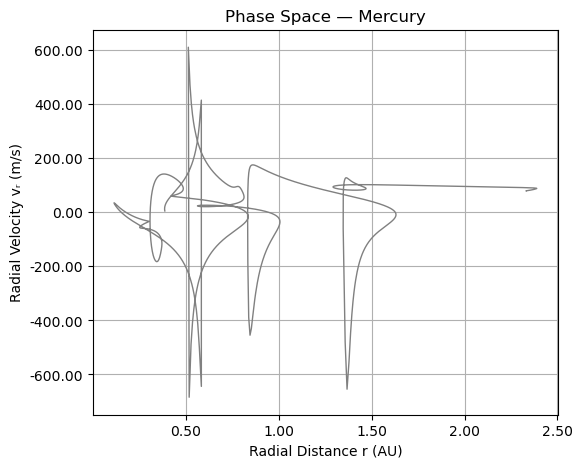

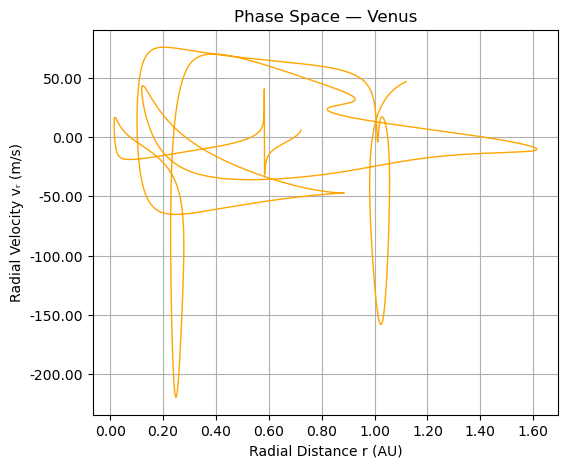

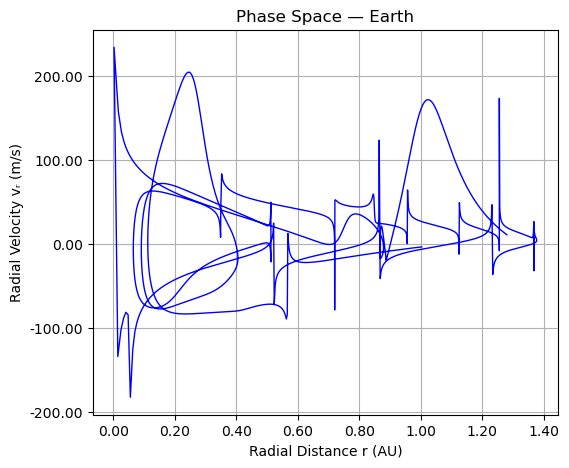

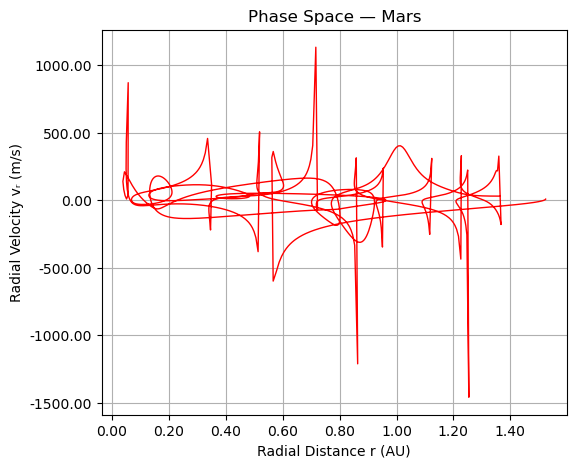

In [164]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def plot_phase_space(sol, masses):
    n = len(masses)
    AU = 1.496e11
    
    pos = sol.y[:2*n].reshape(n,2,-1)
    vel = sol.y[2*n:].reshape(n,2,-1)

    planet_names = ["Sun", "Mercury", "Venus", "Earth", "Mars"]
    colors = ["gold", "gray", "orange", "blue", "red"]

    for i in range(1, n):   # Skip Sun
        r_vec = pos[i] - pos[0]
        r = np.linalg.norm(r_vec, axis=0) / AU
        vr = np.sum(r_vec * vel[i], axis=0) / (np.linalg.norm(r_vec, axis=0) + 1e-12)

        plt.figure(figsize=(6,5))
        plt.plot(r, vr, lw=1.0, color=colors[i])

        # ⭐ Only format tick labels, do NOT modify actual data
        plt.gca().xaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
        plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

        plt.xlabel("Radial Distance r (AU)")
        plt.ylabel("Radial Velocity vᵣ (m/s)")
        plt.grid(True)
        plt.title(f"Phase Space — {planet_names[i]}")
        plt.show()



plot_phase_space(sol, masses)


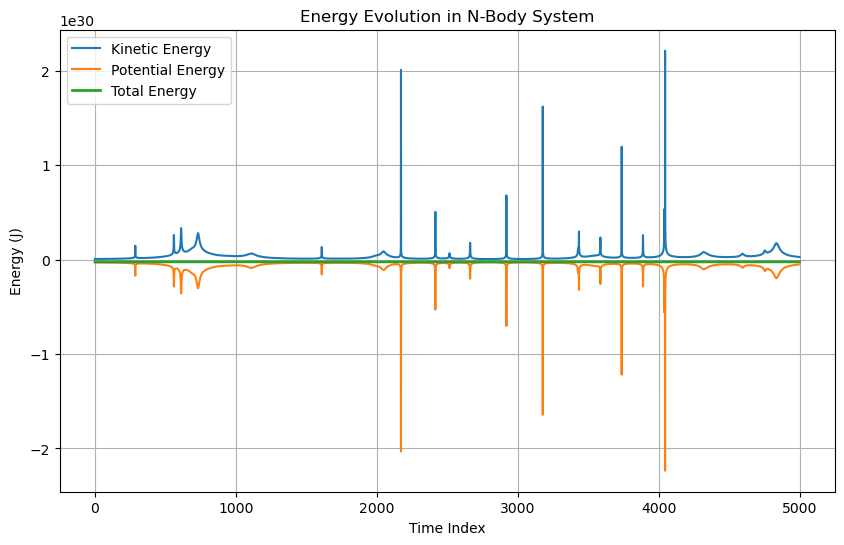

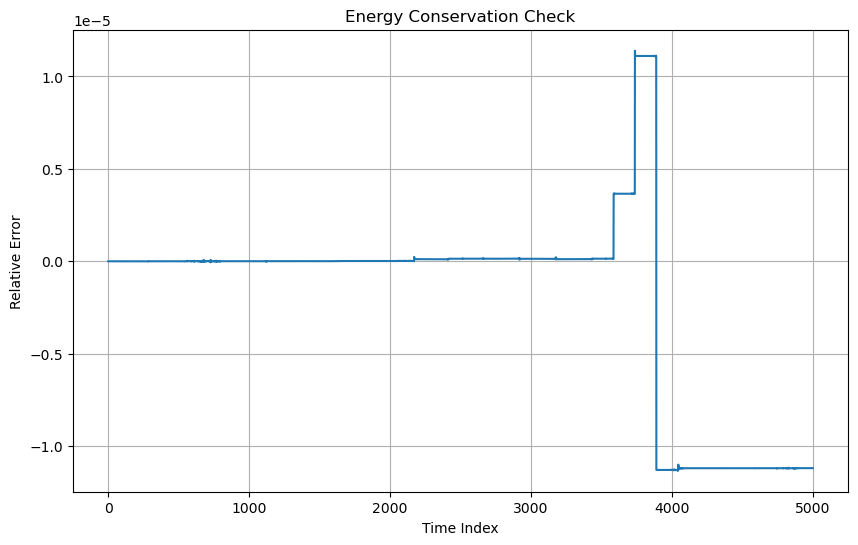

In [165]:
import numpy as np
import matplotlib.pyplot as plt

def compute_energy(sol, masses, G=6.67430e-11):
    n = len(masses)

    # Extract positions and velocities
    pos = sol.y[:2*n].reshape(n,2,-1)
    vel = sol.y[2*n:].reshape(n,2,-1)

    # Kinetic energy
    KE = np.zeros(pos.shape[2])
    for i in range(n):
        v2 = vel[i,0]**2 + vel[i,1]**2
        KE += 0.5 * masses[i] * v2

    # Potential energy
    PE = np.zeros(pos.shape[2])
    for k in range(pos.shape[2]):
        for i in range(n):
            for j in range(i+1, n):
                r = np.linalg.norm(pos[i,:,k] - pos[j,:,k]) + 1e-12
                PE[k] -= G * masses[i] * masses[j] / r

    # Total energy
    E = KE + PE
    return KE, PE, E


def plot_energy(sol, masses):
    KE, PE, E = compute_energy(sol, masses)

    plt.figure(figsize=(10,6))
    plt.plot(KE, label="Kinetic Energy")
    plt.plot(PE, label="Potential Energy")
    plt.plot(E, label="Total Energy", linewidth=2)
    plt.xlabel("Time Index")
    plt.ylabel("Energy (J)")
    plt.title("Energy Evolution in N-Body System")
    plt.grid(True)
    plt.legend()
    plt.show()

    # Relative energy error
    E0 = E[0]
    rel_error = (E - E0) / abs(E0)

    plt.figure(figsize=(10,6))
    plt.plot(rel_error)
    plt.xlabel("Time Index")
    plt.ylabel("Relative Error")
    plt.title("Energy Conservation Check")
    plt.grid(True)
    plt.show()


plot_energy(sol, masses)


In [166]:


from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.ticker as ticker
from matplotlib.collections import LineCollection
from matplotlib.colors import to_rgba
import numpy as np

def animate_orbits_au(sol, masses, stride=10, interval=20, trail_length=300):
    """
    N-body AU animation with fading orbit trails.
    """

    AU = 1.496e11

    planet_names = ["Sun", "Mercury", "Venus", "Earth", "Mars"]
    colors = ["gold", "gray", "orange", "blue", "red"]

    n = len(masses)
    pos = sol.y[:2*n].reshape(n,2,-1) / AU
    pos = pos[:,:,::stride]
    frames = pos.shape[2]

    fig, ax = plt.subplots(figsize=(7,7))
    ax.set_aspect("equal")
    ax.grid(True, alpha=0.3)

    ax.set_xlabel("x (AU)")
    ax.set_ylabel("y (AU)")

    ax.ticklabel_format(useOffset=False, style='plain')
    ax.xaxis.get_major_formatter().set_scientific(False)
    ax.yaxis.get_major_formatter().set_scientific(False)
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))

    all_x = pos[:,0,:].flatten()
    all_y = pos[:,1,:].flatten()
    span = max(all_x.max() - all_x.min(), all_y.max() - all_y.min())
    pad = 0.2 * span
    ax.set_xlim(all_x.min()-pad, all_x.max()+pad)
    ax.set_ylim(all_y.min()-pad, all_y.max()+pad)

    linecols = []
    dots = []

    for i in range(n):
        lc = LineCollection([], linewidths=2)
        ax.add_collection(lc)
        linecols.append(lc)

        dot, = ax.plot([], [], 'o', markersize=7, color=colors[i])
        dots.append(dot)

    ax.legend(dots, planet_names, loc="upper right")

    def update(frame):
        if frame == 0:
            for lc, d in zip(linecols, dots):
                lc.set_segments([])
                d.set_data([], [])
            return linecols + dots

        for i in range(n):
            x = pos[i,0,:frame]
            y = pos[i,1,:frame]

            start = max(0, frame - trail_length)
            xs = x[start:frame]
            ys = y[start:frame]

            points = np.array([xs, ys]).T.reshape(-1,1,2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            # Create fading colors
            base = to_rgba(colors[i])
            alphas = np.linspace(0.0, 1.0, len(segments))
            rgba_colors = [(base[0], base[1], base[2], a) for a in alphas]

            linecols[i].set_segments(segments)
            linecols[i].set_color(rgba_colors)

            dots[i].set_data(x[-1], y[-1])

        return linecols + dots

    anim = FuncAnimation(fig, update, frames=frames, interval=interval, blit=False)
    return HTML(anim.to_jshtml())


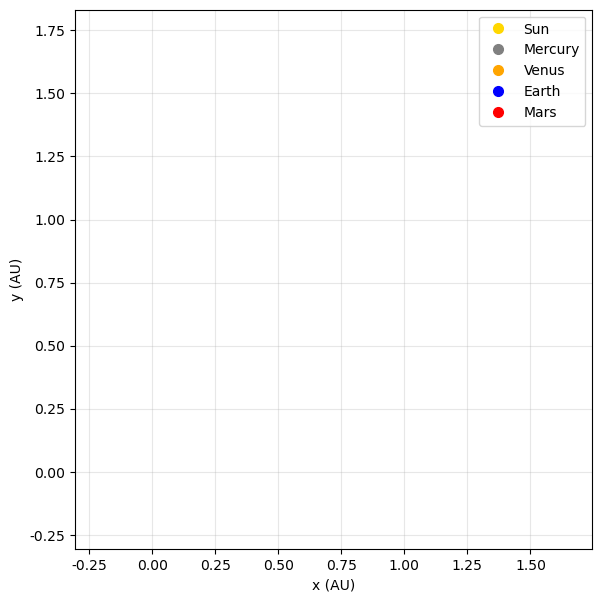

In [171]:
animate_orbits_au(sol, masses, stride=15, trail_length=100)


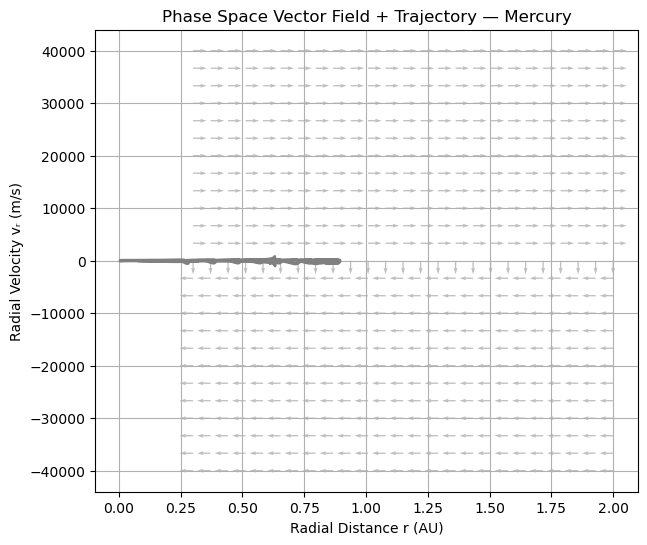

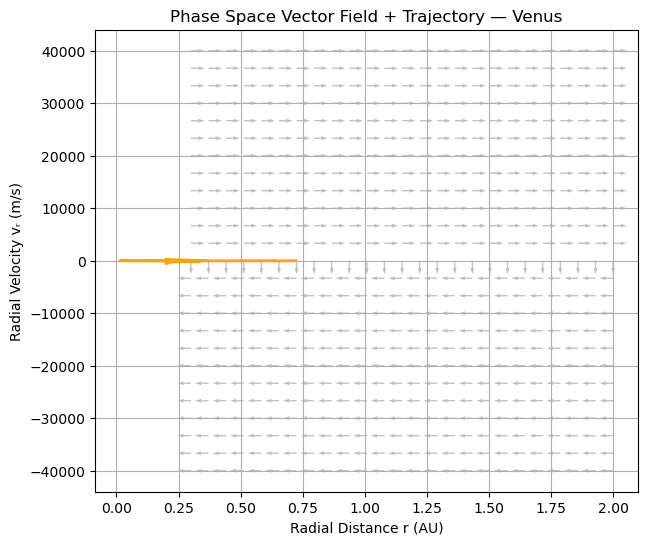

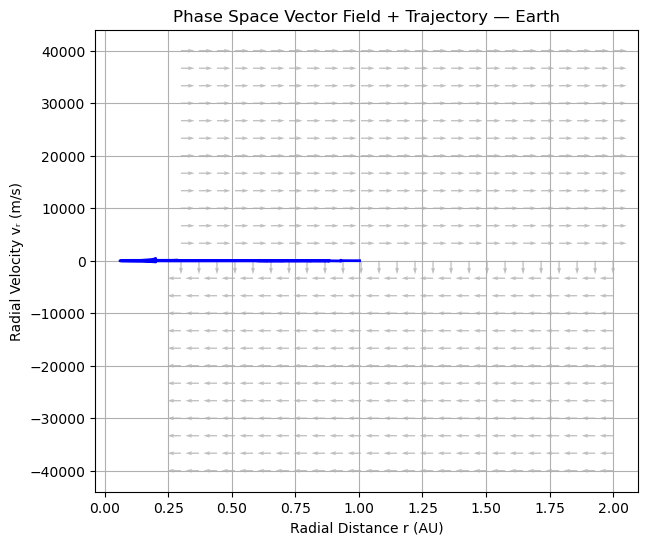

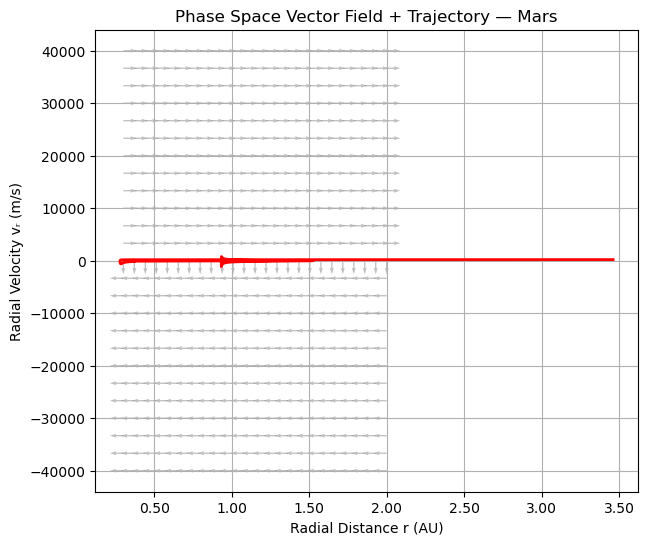

In [136]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def plot_phase_space_vectorfield(sol, masses):
    """
    Plot vector field + phase trajectory (r, v_r) for each planet.
    Same call style as plot_energy(sol, masses).
    """
    
    G = 6.67430e-11
    M_sun = masses[0]
    AU = 1.496e11
    
    n = len(masses)
    
    # Extract position and velocity
    pos = sol.y[:2*n].reshape(n, 2, -1)
    vel = sol.y[2*n:].reshape(n, 2, -1)

    planet_names = ["Sun", "Mercury", "Venus", "Earth", "Mars"]
    colors = ["gold", "gray", "orange", "blue", "red"]

    # ============================
    #  Build vector field grid
    # ============================
    r_vals = np.linspace(0.3, 2.0, 25)     # AU
    vr_vals = np.linspace(-40000, 40000, 25)  # m/s

    R, VR = np.meshgrid(r_vals, vr_vals)
    R_m = R * AU     # convert back to meters

    # ODE structure:
    dR_dt  = VR
    dVR_dt = -G * M_sun / (R_m**2)

    # Normalize vectors so quiver arrows are visible
    # (v_r is large, dv_r small → manually rescale)
    dv_scale = 5e4
    norm = np.sqrt(dR_dt**2 + (dVR_dt * dv_scale)**2)
    dR_plot  = dR_dt  / (norm + 1e-12)
    dVR_plot = dVR_dt * dv_scale / (norm + 1e-12)

    # ============================
    #  Plot per-planet
    # ============================
    for i in range(1, n):  # Skip Sun
        r_vec = pos[i] - pos[0]
        r = np.linalg.norm(r_vec, axis=0) / AU
        vr = np.sum(r_vec * vel[i], axis=0) / (np.linalg.norm(r_vec, axis=0) + 1e-12)

        plt.figure(figsize=(7,6))

        # --- Draw vector field ---
        plt.quiver(R, VR, dR_plot, dVR_plot, 
                   color="gray", alpha=0.5, scale=40)

        # --- Draw actual planet trajectory ---
        plt.plot(r, vr, lw=2, color=colors[i])

        plt.gca().xaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
        plt.xlabel("Radial Distance r (AU)")
        plt.ylabel("Radial Velocity vᵣ (m/s)")
        plt.title(f"Phase Space Vector Field + Trajectory — {planet_names[i]}")
        plt.grid(True)
        plt.show()

plot_phase_space_vectorfield(sol, masses)



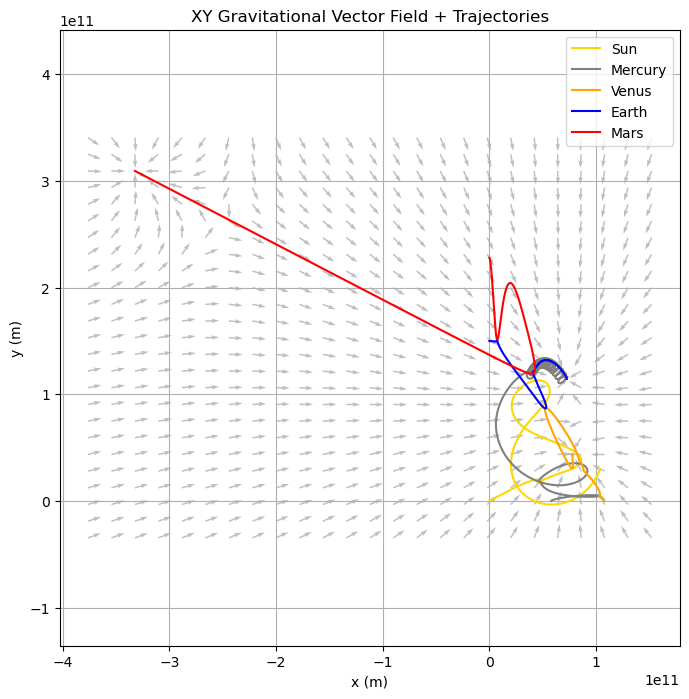

In [137]:
import numpy as np
import matplotlib.pyplot as plt

def plot_xy_vectorfield(sol, masses, grid_points=25):
    """
    Draw gravitational vector field in the xy plane
    and overlay actual trajectories from simulation.
    """

    G = 6.67430e-11
    n = len(masses)

    # Extract x, y positions
    pos = sol.y[:2*n].reshape(n, 2, -1)

    # Use last frame (t = end of simulation) for vector field centers
    final_pos = pos[:, :, -1]  # shape (n, 2)

    # ------------------------------------------
    # Build XY grid for vector field
    # ------------------------------------------
    # Determine plotting window based on all planet positions
    xmin, xmax = np.min(pos[:,0,:]), np.max(pos[:,0,:])
    ymin, ymax = np.min(pos[:,1,:]), np.max(pos[:,1,:])

    # Add a margin
    span_x = xmax - xmin
    span_y = ymax - ymin
    xmin -= 0.1 * span_x
    xmax += 0.1 * span_x
    ymin -= 0.1 * span_y
    ymax += 0.1 * span_y

    x_vals = np.linspace(xmin, xmax, grid_points)
    y_vals = np.linspace(ymin, ymax, grid_points)
    X, Y = np.meshgrid(x_vals, y_vals)

    # ------------------------------------------
    # Compute gravitational acceleration field
    # ------------------------------------------
    AX = np.zeros_like(X)
    AY = np.zeros_like(Y)

    for m, (px, py) in zip(masses, final_pos):
        rx = px - X
        ry = py - Y
        dist2 = rx**2 + ry**2 + 1e-10
        inv_r3 = (dist2)**(-1.5)

        AX += G * m * rx * inv_r3
        AY += G * m * ry * inv_r3

    # Normalize arrows for visibility
    magnitude = np.sqrt(AX**2 + AY**2)
    AXn = AX / (magnitude + 1e-12)
    AYn = AY / (magnitude + 1e-12)

    # ------------------------------------------
    # Plotting
    # ------------------------------------------
    plt.figure(figsize=(8, 8))

    # vector field
    plt.quiver(X, Y, AXn, AYn, color="gray", alpha=0.5)

    # actual trajectories
    colors = ["gold", "gray", "orange", "blue", "red"]
    labels = ["Sun", "Mercury", "Venus", "Earth", "Mars"]

    for i in range(n):
        plt.plot(pos[i,0,:], pos[i,1,:], color=colors[i], label=labels[i], lw=1.5)

    plt.xlabel("x (m)")
    plt.ylabel("y (m)")
    plt.title("XY Gravitational Vector Field + Trajectories")
    plt.legend()
    plt.grid(True)
    plt.axis("equal")
    plt.show()

plot_xy_vectorfield(sol, masses)
